In [22]:
import os
import subprocess

def convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida, nombre_salida):
    os.makedirs(carpeta_salida, exist_ok=True)
    comando = [
        'dcm2niix',
        '-o', carpeta_salida,
        '-f', nombre_salida,
        '-z', 'y',
        carpeta_dicom
    ]
    try:
        subprocess.run(comando, check=True)
        # Eliminar archivo JSON si se genera
        json_path = os.path.join(carpeta_salida, f"{nombre_salida}.json")
        if os.path.exists(json_path):
            os.remove(json_path)
        print(f"Conversión exitosa. Archivo NIfTI guardado como: {nombre_salida}.nii.gz en {carpeta_salida}")
    except subprocess.CalledProcessError as e:
        print(f"Error en la conversión: {e}")

def main():
    carpeta_dicom = "/mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_093_V1/S3010"
    carpeta_salida = "/home/gruneco-server/Biomarcadores_Nifti"
    nombre_salida = "SAN_093_V1"

    if not os.path.exists(carpeta_dicom):
        print("La carpeta DICOM no existe.")
        return
    
    convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida, nombre_salida)

if __name__ == "__main__":
    main()

Chris Rorden's dcm2niiX version v1.0.20220720  (JP2:OpenJPEG) GCC13.2.0 x86-64 (64-bit Linux)
Found 212 DICOM file(s)
Skipping non-image DICOM: /mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_093_V1/S3010/I11
Philips Scaling Values RS:RI:SS = 2.41026:0:0.00582144 (see PMC3998685)
Convert 211 DICOM as /home/gruneco-server/Biomarcadores_Nifti/SAN_093_V1 (256x256x211x1)
Compress: "/usr/bin/pigz" -b 960 -n -f -6 "/home/gruneco-server/Biomarcadores_Nifti/SAN_093_V1.nii"
Conversion required 3.233428 seconds (0.300560 for core code).
Conversión exitosa. Archivo NIfTI guardado como: SAN_093_V1.nii.gz en /home/gruneco-server/Biomarcadores_Nifti


In [7]:
import os
import subprocess

def convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida, nombre_salida):
    os.makedirs(carpeta_salida, exist_ok=True)
    comando = [
        'dcm2niix',
        '-o', carpeta_salida,
        '-f', nombre_salida,
        '-z', 'y',
        carpeta_dicom
    ]
    try:
        subprocess.run(comando, check=True)
        # Mover archivo NIfTI fuera de la carpeta de salida
        nifti_gz_path = os.path.join(carpeta_salida, f"{nombre_salida}.nii.gz")
        nifti_final_path = os.path.join(os.path.dirname(carpeta_salida), f"{nombre_salida}.nii.gz")
        if os.path.exists(nifti_gz_path):
            os.rename(nifti_gz_path, nifti_final_path)
        # Eliminar archivo JSON si se genera
        json_path = os.path.join(carpeta_salida, f"{nombre_salida}.json")
        if os.path.exists(json_path):
            os.remove(json_path)
        # Eliminar carpeta_salida si queda vacía
        if not os.listdir(carpeta_salida):
            os.rmdir(carpeta_salida)
        print(f"Conversión exitosa. Archivo NIfTI guardado como: {nifti_final_path}")
    except subprocess.CalledProcessError as e:
        print(f"Error en la conversión: {e}")

def main():
    carpeta_sujeto = "/mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_001_V1"  # Cambia esto a la carpeta del sujeto
    carpeta_dicom = os.path.join(carpeta_sujeto, "S2010")
    carpeta_salida = os.path.join("/home/gruneco-server/Biomarcadores_Nifti", os.path.basename(carpeta_sujeto))  # Carpeta de salida con el nombre del sujeto
    nombre_salida = os.path.basename(carpeta_sujeto)  # Nombre del archivo NIfTI igual al nombre del sujeto

    if not os.path.exists(carpeta_dicom):
        print("La carpeta S2010 no existe en la carpeta del sujeto.")
        return
    
    convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida, nombre_salida)

if __name__ == "__main__":
    main()


Chris Rorden's dcm2niiX version v1.0.20220720  (JP2:OpenJPEG) GCC13.2.0 x86-64 (64-bit Linux)
Found 212 DICOM file(s)
Skipping non-image DICOM: /mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_001_V1/S2010/I11
Philips Scaling Values RS:RI:SS = 1.99756:0:0.00792024 (see PMC3998685)
Convert 211 DICOM as /home/gruneco-server/Biomarcadores_Nifti/SAN_001_V1/SAN_001_V1 (256x256x211x1)
Compress: "/usr/bin/pigz" -b 960 -n -f -6 "/home/gruneco-server/Biomarcadores_Nifti/SAN_001_V1/SAN_001_V1.nii"
Conversion required 0.335177 seconds (0.233662 for core code).
Conversión exitosa. Archivo NIfTI guardado como: /home/gruneco-server/Biomarcadores_Nifti/SAN_001_V1.nii.gz


In [9]:
import os
import subprocess

def convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida, nombre_salida):
    os.makedirs(carpeta_salida, exist_ok=True)
    comando = [
        'dcm2niix',
        '-o', carpeta_salida,
        '-f', nombre_salida,
        '-z', 'y',
        carpeta_dicom
    ]
    try:
        subprocess.run(comando, check=True)
        # Mover archivo NIfTI fuera de la carpeta de salida
        nifti_gz_path = os.path.join(carpeta_salida, f"{nombre_salida}.nii.gz")
        nifti_final_path = os.path.join(carpeta_salida, f"{nombre_salida}.nii.gz")
        if os.path.exists(nifti_gz_path):
            os.rename(nifti_gz_path, nifti_final_path)
        # Eliminar archivo JSON si se genera
        json_path = os.path.join(carpeta_salida, f"{nombre_salida}.json")
        if os.path.exists(json_path):
            os.remove(json_path)
        print(f"Conversión exitosa para {nombre_salida}. Archivo NIfTI guardado como: {nifti_final_path}")
    except subprocess.CalledProcessError as e:
        print(f"Error en la conversión para {nombre_salida}: {e}")

def main():
    carpeta_principal = "/mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores"  # Carpeta con todos los sujetos
    carpeta_salida_base = "/home/gruneco-server/Biomarcadores_Nifti"  # Carpeta base de salida
    os.makedirs(carpeta_salida_base, exist_ok=True)
    
    for sujeto in os.listdir(carpeta_principal):
        carpeta_sujeto = os.path.join(carpeta_principal, sujeto)
        carpeta_dicom = os.path.join(carpeta_sujeto, "S2010")
        if os.path.exists(carpeta_dicom):
            nombre_salida = sujeto  # Nombre del archivo NIfTI igual al nombre del sujeto
            convertir_dicom_a_nifti(carpeta_dicom, carpeta_salida_base, nombre_salida)
        else:
            print(f"La carpeta S2010 no existe para el sujeto: {sujeto}")

if __name__ == "__main__":
    main()


Chris Rorden's dcm2niiX version v1.0.20220720  (JP2:OpenJPEG) GCC13.2.0 x86-64 (64-bit Linux)
Found 212 DICOM file(s)
Skipping non-image DICOM: /mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_043_V1/S2010/I11
Philips Scaling Values RS:RI:SS = 1.87277:0:0.0082818 (see PMC3998685)
Convert 211 DICOM as /home/gruneco-server/Biomarcadores_Nifti/SAN_043_V1 (256x256x211x1)
Compress: "/usr/bin/pigz" -b 960 -n -f -6 "/home/gruneco-server/Biomarcadores_Nifti/SAN_043_V1.nii"
Conversion required 0.333225 seconds (0.226406 for core code).
Conversión exitosa para SAN_043_V1. Archivo NIfTI guardado como: /home/gruneco-server/Biomarcadores_Nifti/SAN_043_V1.nii.gz
La carpeta S2010 no existe para el sujeto: SAN_074_V1
Chris Rorden's dcm2niiX version v1.0.20220720  (JP2:OpenJPEG) GCC13.2.0 x86-64 (64-bit Linux)
Found 212 DICOM file(s)
Skipping non-image DICOM: /mnt/pci-0000:00:17.0-ata-1.0/NuevoInventario-Biomarcadores/SAN_001_V1/S2010/I11
Philips Scaling Values RS:RI:SS = 1.99756:0:0.007

Total de imágenes encontradas: 61


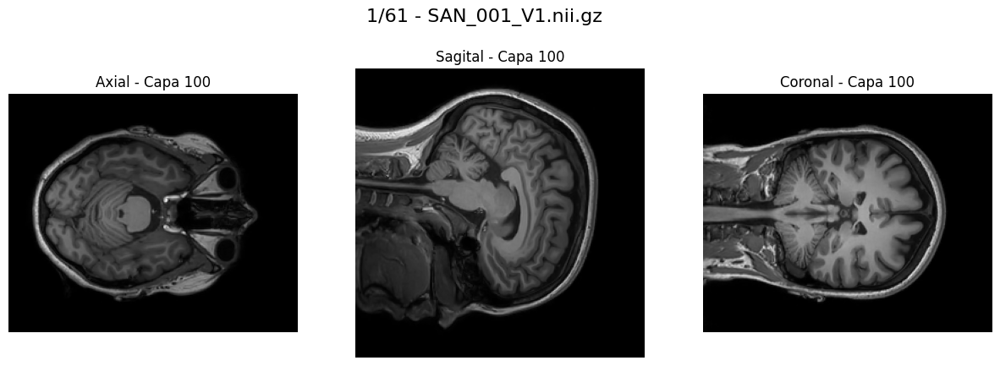

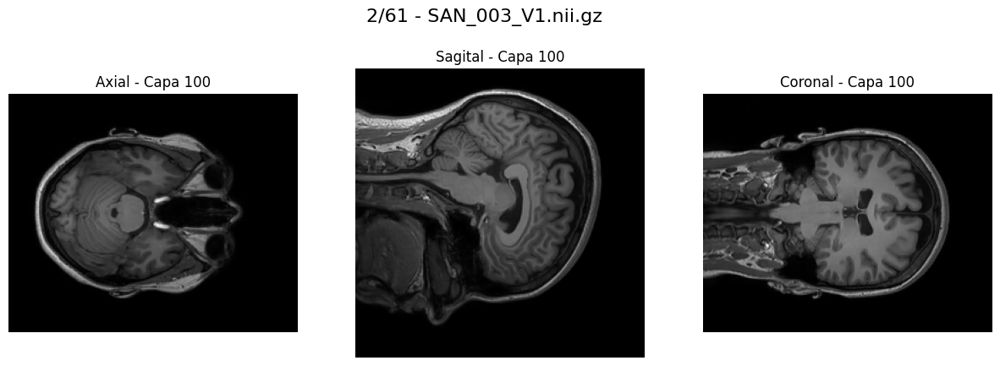

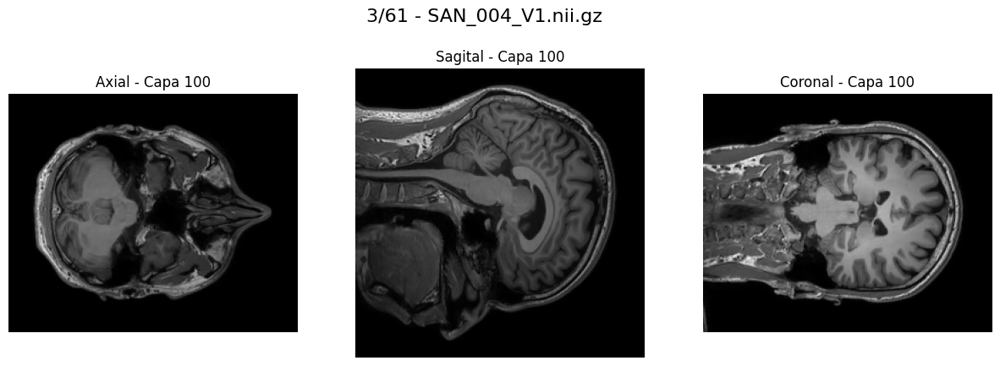

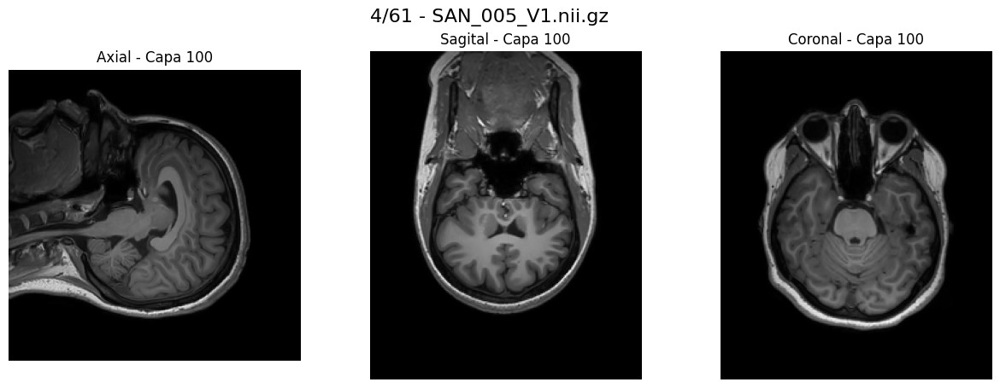

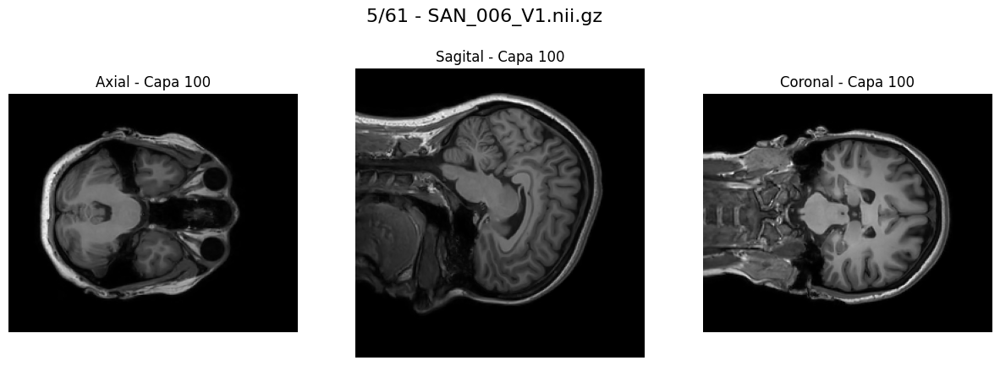

...

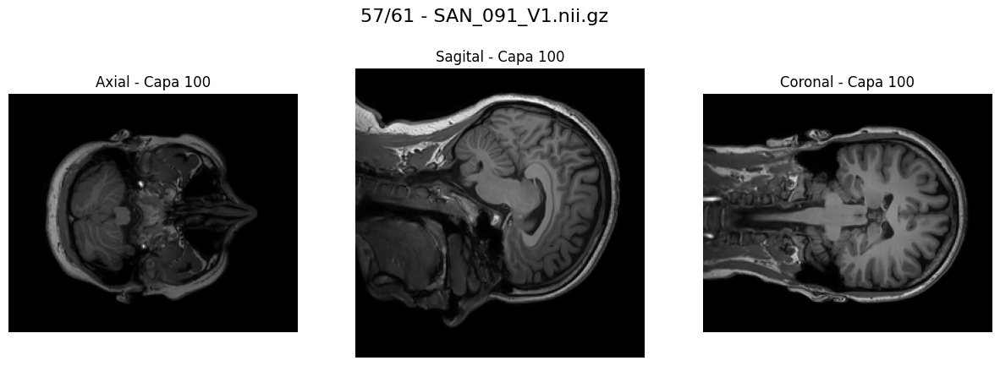

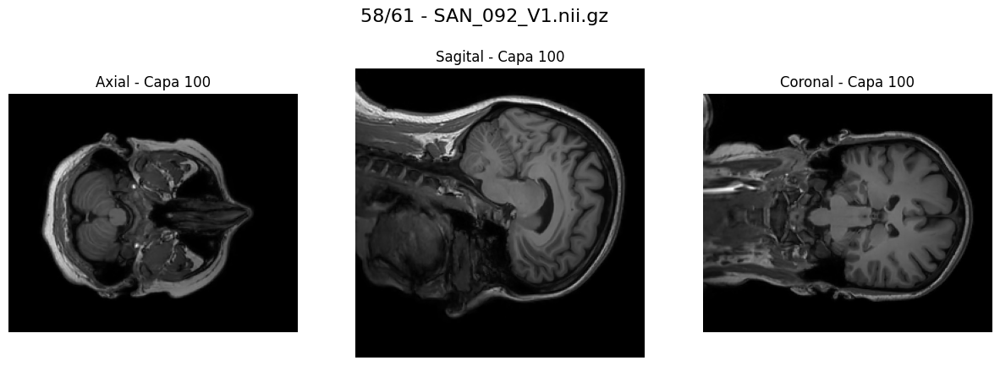

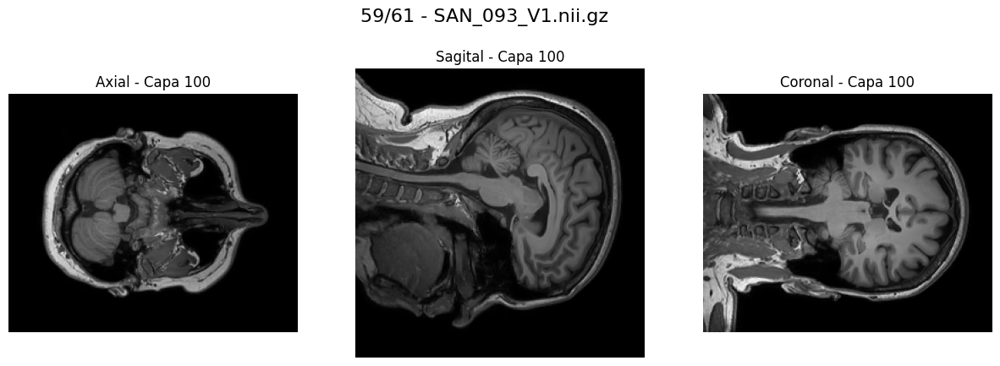

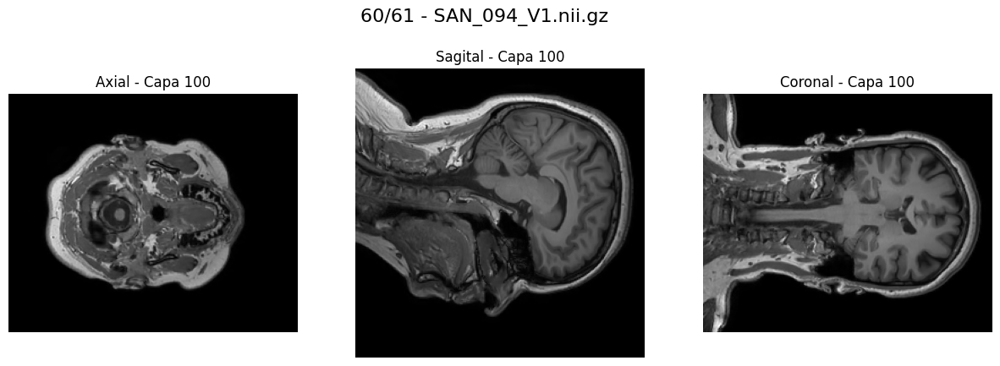

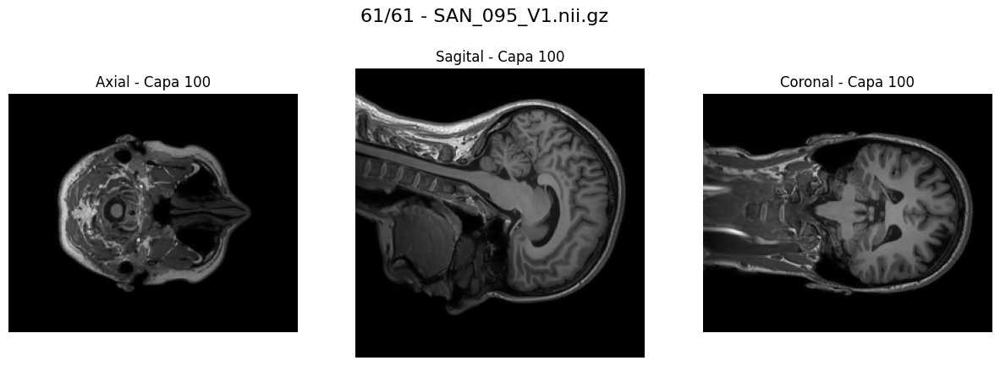

In [24]:
import os
import nibabel as nib
import matplotlib.pyplot as plt

def mostrar_todas_las_imagenes(carpeta_nifti, corte_index):
    """
    Carga y muestra los tres cortes (axial, sagital y coronal) de todas las imágenes NIfTI en una carpeta.
    
    :param carpeta_nifti: Ruta a la carpeta que contiene las imágenes NIfTI.
    :param corte_index: Índice del corte que deseas visualizar.
    """
    archivos_nifti = [f for f in os.listdir(carpeta_nifti) if f.endswith('.nii') or f.endswith('.nii.gz')]
    print(f"Total de imágenes encontradas: {len(archivos_nifti)}")
    
    for i, archivo in enumerate(sorted(archivos_nifti), start=1):
        ruta_nifti = os.path.join(carpeta_nifti, archivo)
        img = nib.load(ruta_nifti)
        data = img.get_fdata()
        
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f"{i}/{len(archivos_nifti)} - {archivo}", fontsize=16)
        
        # Axial
        axs[0].imshow(data[:, :, corte_index], cmap="gray")
        axs[0].set_title(f"Axial - Capa {corte_index}")
        axs[0].axis("off")
        
        # Sagital
        axs[1].imshow(data[corte_index, :, :], cmap="gray")
        axs[1].set_title(f"Sagital - Capa {corte_index}")
        axs[1].axis("off")
        
        # Coronal
        axs[2].imshow(data[:, corte_index, :], cmap="gray")
        axs[2].set_title(f"Coronal - Capa {corte_index}")
        axs[2].axis("off")
        
        plt.show()

# Ejemplo de uso
carpeta_nifti = '/home/gruneco-server/Biomarcadores_Nifti'
corte_index = 100  # Cambia este valor al índice del corte que deseas visualizar
mostrar_todas_las_imagenes(carpeta_nifti, corte_index)



In [23]:
import os
import nibabel as nib
import matplotlib.pyplot as plt

def verificar_pacientes_faltantes(carpeta_nifti):
    pacientes_esperados = [
        "SAN_001", "SAN_003", "SAN_004", "SAN_005", "SAN_006", "SAN_008", "SAN_009", "SAN_015", "SAN_021", "SAN_022", "SAN_023", "SAN_024", "SAN_030", "SAN_032", "SAN_034", "SAN_036", "SAN_038", "SAN_040", "SAN_042", "SAN_043", "SAN_044", "SAN_046", "SAN_047", "SAN_050", "SAN_051", "SAN_052", "SAN_053", "SAN_055", "SAN_058", "SAN_059", "SAN_060", "SAN_061", "SAN_065", "SAN_066", "SAN_067", "SAN_069", "SAN_070", "SAN_071", "SAN_073", "SAN_074", "SAN_075", "SAN_076", "SAN_077", "SAN_078", "SAN_079", "SAN_080", "SAN_081", "SAN_082", "SAN_083", "SAN_084", "SAN_085", "SAN_086", "SAN_087", "SAN_088", "SAN_089", "SAN_090", "SAN_091", "SAN_092", "SAN_093", "SAN_094", "SAN_095"
    ]

    archivos_nifti = [f[:7] for f in os.listdir(carpeta_nifti) if f.endswith('.nii') or f.endswith('.nii.gz')]
    pacientes_faltantes = [p for p in pacientes_esperados if p not in archivos_nifti]

    if pacientes_faltantes:
        print("Pacientes faltantes:")
        for paciente in pacientes_faltantes:
            print(paciente)
    else:
        print("No hay pacientes faltantes.")

# Ejemplo de uso
carpeta_nifti = '/home/gruneco-server/Biomarcadores_Nifti'
verificar_pacientes_faltantes(carpeta_nifti)

No hay pacientes faltantes.
